In [ ]:
%load_ext autoreload
%autoreload 2
import os
import sys

project_root = os.path.abspath('/home/user/perso/trading/alphalab')

if project_root not in sys.path:
    sys.path.append(project_root)

### Simple Wave Animation

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# 1. Configuration standard de la figure (sans commande magique %)
fig, ax = plt.subplots(figsize=(10, 5))
ax.set_xlim(0, 2 * np.pi)
ax.set_ylim(-1.5, 1.5)
ax.set_title("Animation HTML5 d'une courbe sinusoïdale", fontsize=12)

line, = ax.plot([], [], color="teal", linewidth=3)
x = np.linspace(0, 2 * np.pi, 200)

total_frames = 60
shift_speed = (2 * np.pi) / total_frames

# 2. Initialisation
def init():
    line.set_data([], [])
    return line,

# 3. Mise à jour
def update(frame):
    y = np.sin(x + frame * shift_speed)
    line.set_data(x, y)
    return line,

# 4. Création de l'animation
anim = FuncAnimation(
    fig=fig,
    func=update,
    frames=total_frames,
    init_func=init,
    blit=True,
    interval=30
)

# On ferme la figure statique pour éviter les doublons d'affichage fixes
plt.close(fig)

# 5. L'ASTUCE : Rendu sous forme de lecteur multimédia interactif
HTML(anim.to_jshtml())


### Boilerplate free

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def create_loop_animation(wave_function, title="Animation Loop", total_frames=60, interval=30, color="teal", y_min=-2.5, y_max=2.5):
    """
    Stable animation helper with adjustable Y-axis limits to prevent clipping.
    """
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.set_xlim(0, 2 * np.pi)

    # FIX: Use dynamic or wider limits for the Y axis
    ax.set_ylim(y_min, y_max)
    ax.set_title(title, fontsize=12)

    line, = ax.plot([], [], color=color, linewidth=3)
    x = np.linspace(0, 2 * np.pi, 200)
    shift_speed = (2 * np.pi) / total_frames

    def init():
        line.set_data([], [])
        return line,

    def update(frame):
        current_shift = frame * shift_speed
        y = wave_function(x, current_shift)
        line.set_data(x, y)
        return line,

    anim = FuncAnimation(
        fig=fig, func=update, frames=total_frames,
        init_func=init, blit=True, interval=interval
    )

    plt.close(fig)
    return HTML(anim.to_jshtml())


In [25]:
def my_combined_wave(x, shift):
    return np.sin(x + shift) + np.sin(0.5 * shift)

# The new default limits (-2.5 to 2.5) will perfectly fit your wave
create_loop_animation(my_combined_wave, title="Combined Wave Pattern", color="darkorange")


### Live drawing mode

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from tqdm.notebook import tqdm  # Specialized tqdm version for Jupyter Notebooks

def create_loop_animation_with_progress(wave_function, title="Animation Loop", total_frames=60, interval=30, color="teal", y_min=-2.5, y_max=2.5):
    """
    Stable animation helper with a live tqdm progress bar to track frame rendering.
    """
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.set_xlim(0, 2 * np.pi)
    ax.set_ylim(y_min, y_max)
    ax.set_title(title, fontsize=12)

    line, = ax.plot([], [], color=color, linewidth=3)
    x = np.linspace(0, 2 * np.pi, 200)
    shift_speed = (2 * np.pi) / total_frames

    # Initialize the progress bar for the total number of frames
    progress_bar = tqdm(total=total_frames, desc="Rendering Frames")

    def init():
        line.set_data([], [])
        return line,

    def update(frame):
        current_shift = frame * shift_speed
        y = wave_function(x, current_shift)
        line.set_data(x, y)

        # Advance the progress bar by 1 every time a frame is rendered
        progress_bar.update(1)
        return line,

    anim = FuncAnimation(
        fig=fig, func=update, frames=total_frames,
        init_func=init, blit=True, interval=interval
    )

    # Generating the HTML triggers the update loop and updates our progress bar
    html_output = HTML(anim.to_jshtml())

    # Close the progress bar manually once the calculation is done
    progress_bar.close()
    plt.close(fig)

    return html_output


In [10]:
def my_wave(x, shift):
    return np.sin(x + shift) + np.sin(0.5 * shift)

# Let's generate a 1-minute eco animation (600 frames, 100ms interval)
create_loop_animation_with_progress(
    my_wave,
    title="1-Minute Long Animation",
    total_frames=300, # nb_secs (60) * (1 / fps) (100)
    interval=100,
    color="darkviolet"
)


Rendering Frames:   0%|          | 0/300 [00:00<?, ?it/s]

### Matplotlib / clear output

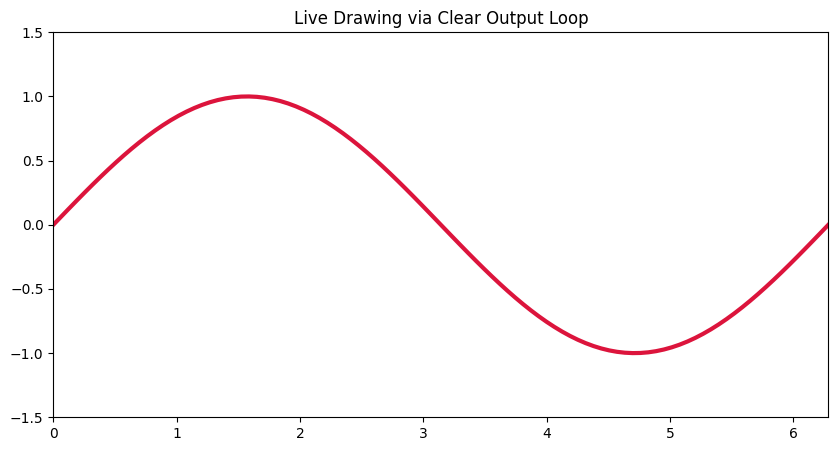

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import time
from IPython.display import clear_output, display

fig, ax = plt.subplots(figsize=(10, 5))
x_space = np.linspace(0, 2 * np.pi, 100)
x_data, y_data = [], []

for i in range(100):
    x_data.append(x_space[i])
    y_data.append(np.sin(x_space[i]))

    # Reset and clear the previous frame plot
    ax.cla()
    ax.set_xlim(0, 2 * np.pi)
    ax.set_ylim(-1.5, 1.5)
    ax.set_title("Live Drawing via Clear Output Loop")

    ax.plot(x_data, y_data, color="crimson", linewidth=3)

    # Clear the notebook cell output and redraw the current frame instantly
    clear_output(wait=True)
    display(fig)
    # time.sleep(0.005)

plt.close(fig) # Prevent duplicate static display at the end


# Bokeh

In [15]:
!pip install bokeh

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 1.5 MB/s  0:00:04a 0:00:01m eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [bokeh]━━━━━ 1/2 [bokeh]


In [17]:
# First run: pip install bokeh
from bokeh.io import output_notebook, show, push_notebook
from bokeh.plotting import figure
import numpy as np
import time

output_notebook() # Enable Bokeh inside Jupyter Notebook

# Setup layout structure
plot = figure(width=800, height=400, y_range=(-1.5, 1.5), title="Bokeh Live Streaming Vector Plot")
data_source = plot.line([], [], line_width=3, color="navy")

# Render the initial empty graphic placeholder
handle = show(plot, notebook_handle=True)

x_space = np.linspace(0, 2 * np.pi, 100)
x_data, y_data = [], []

for i in range(100):
    x_data.append(x_space[i])
    y_data.append(np.sin(x_space[i]))

    # Directly inject the new data stream array into the graphic layout
    data_source.data_source.data = {'x': x_data, 'y': y_data}

    # Push the updates to the active browser view component
    push_notebook(handle=handle)
    time.sleep(0.03)


Loading BokehJS ...

# Back to MPL

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import time
from IPython.display import clear_output, display

def create_live_stream_animation(wave_function, title="Live Stream Loop", total_frames=100, interval=30, color="crimson", y_min=-1.5, y_max=1.5):
    """
    Boilerplate-free live drawing engine for Jupyter/VS Code using clear_output.
    Provides instant generation and real-time interruption.
    """
    fig, ax = plt.subplots(figsize=(10, 5))
    x_space = np.linspace(0, 2 * np.pi, total_frames)
    x_data, y_data = [], []

    # Calculate sleep time in seconds from interval (milliseconds)
    sleep_time = interval / 1000.0

    try:
        for i in range(total_frames):
            current_x = x_space[i]
            current_y = wave_function(current_x)

            x_data.append(current_x)
            y_data.append(current_y)

            # Wipe the axes canvas before redrawing
            ax.cla()
            ax.set_xlim(0, 2 * np.pi)
            ax.set_ylim(y_min, y_max)
            ax.set_title(title, fontsize=12)

            # Draw the growing line and the leading dot
            ax.plot(x_data, y_data, color=color, linewidth=3)
            ax.plot([x_data[-1]], [y_data[-1]], color="black", marker="o", markersize=8)

            # Refresh the Jupyter cell display output
            clear_output(wait=True)
            display(fig)

            # time.sleep(sleep_time)

    except KeyboardInterrupt:
        print("\n[INFO] Live drawing streaming interrupted by user.")

    finally:
        # Guarantee that the memory is cleaned up to avoid ghost plots
        plt.close(fig)


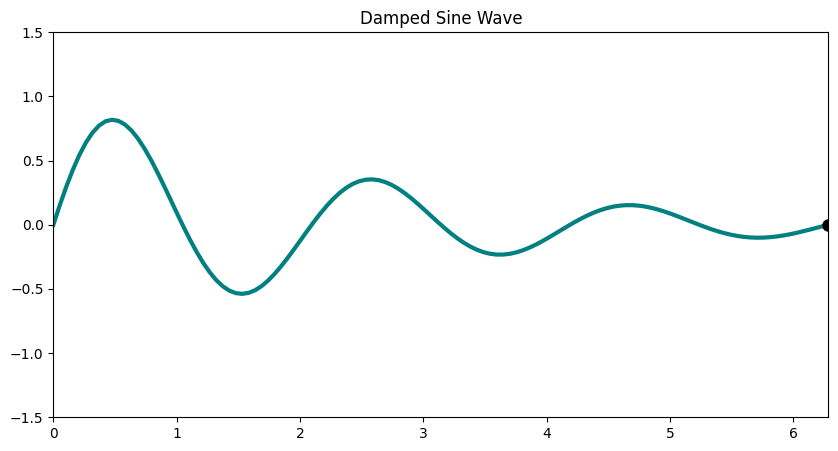

In [29]:
def damped_sine(x):
    # The exponential function shrinks the sine wave as x grows
    return np.sin(3 * x) * np.exp(-0.4 * x)

# Instant launch, no progress bar needed!
create_live_stream_animation(damped_sine, title="Damped Sine Wave", total_frames=120, color="teal")


# Infinite animation

In [55]:
import numpy as np
import matplotlib.pyplot as plt
import time
from IPython.display import clear_output, display

def create_infinite_live_stream(wave_function, title="Infinite Live Stream", total_frames=100, interval=30, color="crimson", y_min=-1.5, y_max=1.5):
    """
    Boilerplate-free live drawing engine that runs in an infinite loop.
    Clears and restarts automatically once it reaches the right edge.
    """
    fig, ax = plt.subplots(figsize=(10, 5))
    x_space = np.linspace(0, 2 * np.pi, total_frames)
    sleep_time = interval / 1000.0

    try:
        # Infinite master loop to repeat the animation forever
        while True:
            x_data, y_data = [], []

            # Internal loop to draw the wave frame by frame
            for i in range(total_frames):
                current_x = x_space[i]
                current_y = wave_function(current_x)

                x_data.append(current_x)
                y_data.append(current_y)

                # Wipe the canvas
                ax.cla()
                ax.set_xlim(0, 2 * np.pi)
                ax.set_ylim(y_min, y_max)
                ax.set_title(title, fontsize=12)

                # Plot the line and the leading point
                ax.plot(x_data, y_data, color=color, linewidth=3)
                ax.plot([x_data[-1]], [y_data[-1]], color="black", marker="o", markersize=8)

                # Refresh display
                clear_output(wait=True)
                display(fig)

                # time.sleep(sleep_time)

            # Brief pause before restarting the loop from the left edge
            # time.sleep(0.5)

    except KeyboardInterrupt:
        print("\n[INFO] Infinite live streaming animation stopped by user.")

    finally:
        plt.close(fig)


In [56]:
def my_wave(x):
    return np.sin(2 * x)

# This will run forever until you hit the Interrupt button
create_infinite_live_stream(my_wave, title="Endless Live Drawing Loop", total_frames=100)



[INFO] Infinite live streaming animation stopped by user.


# Widgets

In [34]:
import numpy as np
import matplotlib.pyplot as plt
import time
from IPython.display import clear_output, display
import ipywidgets as widgets

def create_interactive_live_stream(wave_function, title="Interactive Stream", total_frames=100, interval=30, color="teal"):
    """
    Creates an infinite live drawing animation controlled by dynamic Jupyter widgets.
    """
    # 1. Create the UI Widget for Amplitude Control
    # It allows values from 0.1 to 3.0, starting at 1.0
    amplitude_slider = widgets.FloatSlider(
        value=1.0, min=0.1, max=3.0, step=0.1,
        description='Amplitude:', continuous_update=True
    )

    # Render the slider UI component on top of the cell
    display(amplitude_slider)

    fig, ax = plt.subplots(figsize=(10, 5))
    x_space = np.linspace(0, 2 * np.pi, total_frames)
    sleep_time = interval / 1000.0

    try:
        while True:
            x_data, y_data = [], []

            for i in range(total_frames):
                current_x = x_space[i]

                # 2. READ WIDGET VALUE IN REAL TIME:
                # Get the current position of the slider handle dynamically
                current_amplitude = amplitude_slider.value

                # Apply the function multiplied by the slider's amplitude
                current_y = current_amplitude * wave_function(current_x)

                x_data.append(current_x)
                y_data.append(current_y)

                ax.cla()
                ax.set_xlim(0, 2 * np.pi)
                # Keep fixed visual boundaries so the grid doesn't distort when changing amplitude
                ax.set_ylim(-3.5, 3.5)
                ax.set_title(f"{title} (Current Amp: {current_amplitude:.1f})", fontsize=12)

                ax.plot(x_data, y_data, color=color, linewidth=3)
                ax.plot([x_data[-1]], [y_data[-1]], color="black", marker="o", markersize=8)

                clear_output(wait=True)
                # We must re-display the slider at each frame so it doesn't vanish during clear_output
                display(amplitude_slider)
                display(fig)

                time.sleep(sleep_time)

    except KeyboardInterrupt:
        print("\n[INFO] Interactive stream stopped by user.")

    finally:
        plt.close(fig)


FloatSlider(value=1.0, description='Amplitude:', max=3.0, min=0.1)

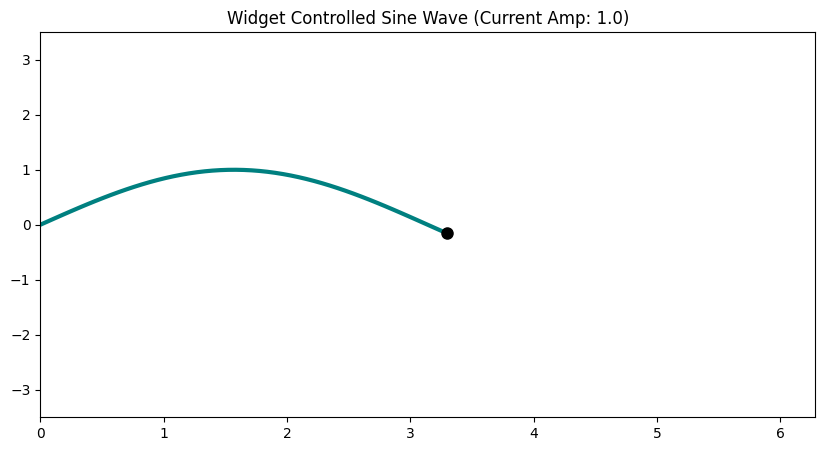


[INFO] Interactive stream stopped by user.


In [35]:
def base_sine(x):
    return np.sin(x)

# Start the interactive dashboard
create_interactive_live_stream(base_sine, title="Widget Controlled Sine Wave")


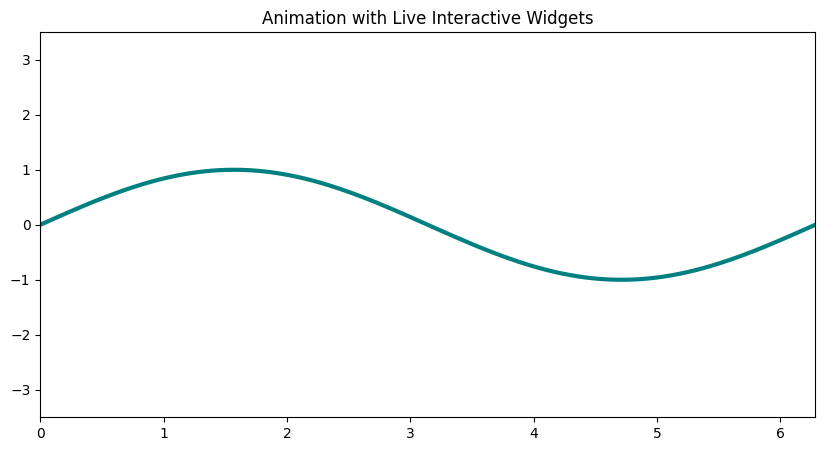

Output()

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets

# 1. Setup the static chart framework (never destroyed)
fig, ax = plt.subplots(figsize=(10, 5))
x = np.linspace(0, 2 * np.pi, 200)

# Create the initial line placeholder
line, = ax.plot(x, np.sin(x), color="teal", linewidth=3)
ax.set_xlim(0, 2 * np.pi)
ax.set_ylim(-3.5, 3.5)
ax.set_title("Animation with Live Interactive Widgets", fontsize=12)

# 2. Define the refresh logic (updates data inside the existing line)
def update_plot(frame, amplitude):
    """
    Updates the wave geometry on the fly.
    'frame' is controlled by the Play button, 'amplitude' by the slider.
    """
    # Map the frame integer (0-60) into a clean 2*pi phase shift rad angle
    current_shift = (frame / 60.0) * 2 * np.pi

    # Calculate new math points
    new_y = amplitude * np.sin(x - current_shift)

    # Push updates directly to the line layer
    line.set_ydata(new_y)
    fig.canvas.draw_idle()

# 3. Create the UI Widget components
# Play widget automatically increments its value from 0 to 60 over time
play_button = widgets.Play(
    value=0, min=0, max=60, step=1,
    interval=30, loop=True, description="Press Play"
)

amplitude_slider = widgets.FloatSlider(
    value=1.0, min=0.1, max=3.0, step=0.1,
    description='Amplitude:'
)

# 4. Link the Play engine and the user sliders to the plotting function
interactive_layout = widgets.interactive_output(
    update_plot,
    {'frame': play_button, 'amplitude': amplitude_slider}
)

# Arrange the UI layout controls nicely on top of each other
ui_controls = widgets.VBox([play_button, amplitude_slider])
display(ui_controls, interactive_layout)

# Output the graphic canvas frame layout
plt.show()


In [38]:
import numpy as np
import matplotlib.pyplot as plt
import time
from IPython.display import clear_output, display
import ipywidgets as widgets

def create_perfect_interactive_loop(wave_function, title="Live Interactive Stream", total_frames=60, interval=30, color="teal"):
    """
    Guaranteed to work in VS Code. Animates automatically while allowing
    the user to slide widgets in real-time without freezing or layout blinking.
    """
    # 1. Create a clean, persistent amplitude slider UI component
    amplitude_slider = widgets.FloatSlider(
        value=1.0, min=0.1, max=3.0, step=0.1,
        description='Amplitude:', continuous_update=True
    )
    display(amplitude_slider)

    fig, ax = plt.subplots(figsize=(10, 5))
    x = np.linspace(0, 2 * np.pi, 200)
    shift_speed = (2 * np.pi) / total_frames
    sleep_time = interval / 1000.0

    try:
        # Endless loop: restarts the animation from the left automatically
        while True:
            for frame in range(total_frames):
                current_shift = frame * shift_speed

                # READ SLIDER ON THE FLY: Get user input value at this millisecond
                current_amp = amplitude_slider.value

                # Compute math points combining animation time (shift) and user control (amplitude)
                y = current_amp * wave_function(x, current_shift)

                # Re-draw the canvas
                ax.cla()
                ax.set_xlim(0, 2 * np.pi)
                ax.set_ylim(-3.5, 3.5)
                ax.set_title(f"{title} (Amp: {current_amp:.1f})", fontsize=12)

                ax.plot(x, y, color=color, linewidth=3)

                # Refresh output display cleanly
                clear_output(wait=True)
                display(amplitude_slider)  # Re-inject slider to avoid layout flickering
                display(fig)

                time.sleep(sleep_time)

    except KeyboardInterrupt:
        print("\n[INFO] Interactive loop animation stopped by user.")

    finally:
        plt.close(fig)


In [39]:
def moving_sine(x, shift):
    return np.sin(x - shift)

# This runs instantly and loops forever
create_perfect_interactive_loop(moving_sine, title="Auto Animation + Live Slider")


FloatSlider(value=1.0, description='Amplitude:', max=3.0, min=0.1)


[INFO] Interactive loop animation stopped by user.


In [40]:
import numpy as np
import matplotlib.pyplot as plt
import time
from IPython.display import display
import ipywidgets as widgets

def create_flawless_interactive_loop(wave_function, title="Flicker-Free Stream", total_frames=60, interval=30, color="teal"):
    """
    Guaranteed flicker-free animation + widget control under VS Code.
    Uses a dedicated widgets.Output container to isolate the rendering process.
    """
    # 1. Create the persistent Slider
    amplitude_slider = widgets.FloatSlider(
        value=1.0, min=0.1, max=3.0, step=0.1, description='Amplitude:'
    )

    # 2. FIX: Create an isolated Output box dedicated ONLY to the plot canvas
    plot_output_box = widgets.Output()

    # Render the layout components permanently in the notebook
    display(amplitude_slider)
    display(plot_output_box)

    # Pre-generate figure and mathematical space
    fig, ax = plt.subplots(figsize=(10, 5))
    x = np.linspace(0, 2 * np.pi, 200)
    shift_speed = (2 * np.pi) / total_frames
    sleep_time = interval / 1000.0

    try:
        while True:
            for frame in range(total_frames):
                current_shift = frame * shift_speed
                current_amp = amplitude_slider.value

                y = current_amp * wave_function(x, current_shift)

                # Update chart layers
                ax.cla()
                ax.set_xlim(0, 2 * np.pi)
                ax.set_ylim(-3.5, 3.5)
                ax.set_title(f"{title} (Amp: {current_amp:.1f})", fontsize=12)
                ax.plot(x, y, color=color, linewidth=3)

                # 3. CRITICAL FIX: Direct the plotting refresh ONLY inside the Output container
                with plot_output_box:
                    plot_output_box.clear_output(wait=True)  # Instantly swaps the image matrix
                    display(fig)

                time.sleep(sleep_time)

    except KeyboardInterrupt:
        print("\n[INFO] Interactive stream stopped safely by user.")

    finally:
        plt.close(fig)


In [41]:
def moving_sine(x, shift):
    return np.sin(x - shift)

# Launch the endless fluid stream
create_flawless_interactive_loop(moving_sine, title="Flawless Live Animation")


FloatSlider(value=1.0, description='Amplitude:', max=3.0, min=0.1)

Output()


[INFO] Interactive stream stopped safely by user.


In [42]:
import numpy as np
import matplotlib.pyplot as plt
import asyncio # FIX: Replaces time.sleep to unblock the widget events
from IPython.display import display
import ipywidgets as widgets

async def create_flawless_interactive_loop(wave_function, title="Flicker-Free Stream", total_frames=60, interval=30, color="teal"):
    """
    Flicker-free animation + active live slider controls under VS Code.
    Uses asyncio to prevent the infinite loop from blocking slider events.
    """
    # 1. Setup persistent UI layout components
    amplitude_slider = widgets.FloatSlider(
        value=1.0, min=0.1, max=3.0, step=0.1, description='Amplitude:'
    )
    plot_output_box = widgets.Output()

    display(amplitude_slider)
    display(plot_output_box)

    # Pre-generate figure context
    fig, ax = plt.subplots(figsize=(10, 5))
    x = np.linspace(0, 2 * np.pi, 200)
    shift_speed = (2 * np.pi) / total_frames
    sleep_time = interval / 1000.0

    try:
        while True:
            for frame in range(total_frames):
                current_shift = frame * shift_speed

                # FIX: Python can now actively capture the updated slider value!
                current_amp = amplitude_slider.value

                y = current_amp * wave_function(x, current_shift)

                # Redraw line data layers
                ax.cla()
                ax.set_xlim(0, 2 * np.pi)
                ax.set_ylim(-3.5, 3.5)
                ax.set_title(f"{title} (Amp: {current_amp:.1f})", fontsize=12)
                ax.plot(x, y, color=color, linewidth=3)

                # Isolated targeted canvas swap
                with plot_output_box:
                    plot_output_box.clear_output(wait=True)
                    display(fig)

                # FIX: Yields control back to the Jupyter notebook event loop
                # This brief release allows your mouse actions to register instantly
                await asyncio.sleep(sleep_time)

    except asyncio.CancelledError:
        print("\n[INFO] Interactive stream stopped safely by user.")

    finally:
        plt.close(fig)


In [43]:
def moving_sine(x, shift):
    return np.sin(x - shift)

# CRITICAL: You must use 'await' to execute the async task loop
await create_flawless_interactive_loop(moving_sine, title="Flawless Live Animation")


FloatSlider(value=1.0, description='Amplitude:', max=3.0, min=0.1)

Output()


[INFO] Interactive stream stopped safely by user.


In [44]:
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display

def create_flawless_animation(wave_function, title="Flicker-Free Active Stream", total_frames=60, interval=30, color="teal"):
    """
    Creates a perfect flicker-free animation with real-time reactive sliders in VS Code.
    Uses native Matplotlib timers instead of blocking loops or clear_output.
    """
    # 1. Create a persistent and unblocked amplitude slider
    amplitude_slider = widgets.FloatSlider(
        value=1.0, min=0.1, max=3.0, step=0.1, description='Amplitude:'
    )
    display(amplitude_slider)

    # 2. Setup a static, persistent figure canvas
    fig, ax = plt.subplots(figsize=(10, 5))
    x = np.linspace(0, 2 * np.pi, 200)
    shift_speed = (2 * np.pi) / total_frames

    # Create the initial permanent line layer object
    line, = ax.plot(x, np.zeros_like(x), color=color, linewidth=3)
    ax.set_xlim(0, 2 * np.pi)
    ax.set_ylim(-3.5, 3.5)
    ax.set_title(title, fontsize=12)

    # Tracking variable for the current frame step
    state = {'frame': 0}

    def animate_step(event):
        """
        Background worker function triggered by the timer at every interval.
        """
        frame = state['frame']
        current_shift = frame * shift_speed

        # ACTIVE CAPTURE: Slider events are fully unblocked and read instantly
        current_amp = amplitude_slider.value

        # Update only the data points inside the existing line layer
        new_y = current_amp * wave_function(x, current_shift)
        line.set_ydata(new_y)

        # Repaint only the line layer on the active screen canvas
        fig.canvas.draw_idle()

        # Advance frame counter or loop back to zero
        state['frame'] = (frame + 1) % total_frames

    # 3. FIX: Attach a non-blocking background timer directly to the canvas frame
    # This leaves the Jupyter Kernel 100% free to listen to your mouse on the slider
    timer = fig.canvas.new_timer(interval=interval)
    timer.add_callback(animate_step)
    timer.start()

    plt.show()


FloatSlider(value=1.0, description='Amplitude:', max=3.0, min=0.1)

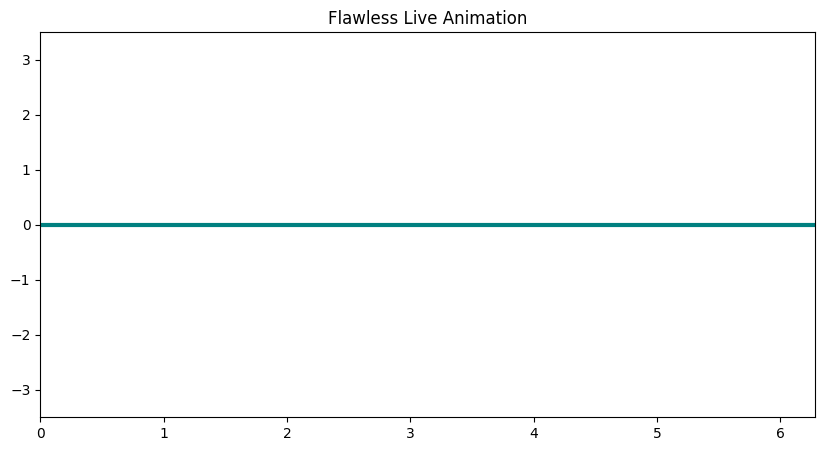

In [46]:
def moving_sine(x, shift):
    return np.sin(x - shift)

# Instant launch with zero lag
create_flawless_animation(moving_sine, title="Flawless Live Animation")


interactive(children=(FloatSlider(value=1.0, description='Amplitude:', max=3.0, min=0.1), FloatSlider(value=0.…

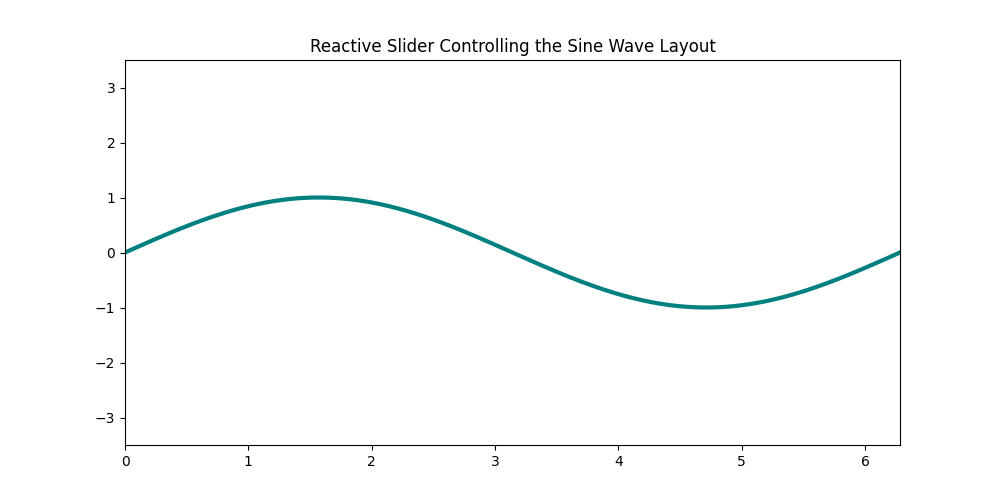

In [49]:
%matplotlib widget

import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display

# 1. Generate the shared data and figure once
x = np.linspace(0, 2 * np.pi, 200)
fig, ax = plt.subplots(figsize=(10, 5))

# Create the permanent, static line layer placeholder
line, = ax.plot(x, np.sin(x), color="teal", linewidth=3)
ax.set_xlim(0, 2 * np.pi)
ax.set_ylim(-3.5, 3.5)
ax.set_title("Reactive Slider Controlling the Sine Wave Layout", fontsize=12)

# 2. Define the callback function triggered whenever a slider moves
def update_wave(amplitude=1.0, shift=0.0):
    """
    Directly updates the coordinates of the existing line layer
    without destroying the canvas grid or causing any flicker.
    """
    # Calculate the new math points combining amplitude and phase shift
    new_y = amplitude * np.sin(x + shift)

    # Push the new y-coordinates to the line data holder
    line.set_ydata(new_y)

    # Request the canvas frame to gently repaint itself
    fig.canvas.draw_idle()

# 3. Build the native dashboard using ipywidgets interact
# continuous_update=True guarantees real-time response while dragging the handle
widgets.interact(
    update_wave,
    amplitude=widgets.FloatSlider(value=1.0, min=0.1, max=3.0, step=0.1, continuous_update=True, description='Amplitude:'),
    shift=widgets.FloatSlider(value=0.0, min=0.0, max=2*np.pi, step=0.1, continuous_update=True, description='Phase Shift:')
)

plt.show()
plt.close()


# Last working code

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import time
from IPython.display import clear_output, display

def create_infinite_live_stream(wave_function, title="Infinite Live Stream", total_frames=100, interval=30, color="crimson", y_min=-1.5, y_max=1.5):
    """
    Boilerplate-free live drawing engine that runs in an infinite loop.
    Clears and restarts automatically once it reaches the right edge.
    """
    fig, ax = plt.subplots(figsize=(10, 5))
    x_space = np.linspace(0, 2 * np.pi, total_frames)
    sleep_time = interval / 1000.0

    try:
        # Infinite master loop to repeat the animation forever
        while True:
            x_data, y_data = [], []

            # Internal loop to draw the wave frame by frame
            for i in range(total_frames):
                current_x = x_space[i]
                current_y = wave_function(current_x)

                x_data.append(current_x)
                y_data.append(current_y)

                # Wipe the canvas
                ax.cla()
                ax.set_xlim(0, 2 * np.pi)
                ax.set_ylim(y_min, y_max)
                ax.set_title(title, fontsize=12)

                # Plot the line and the leading point
                ax.plot(x_data, y_data, color=color, linewidth=3)
                ax.plot([x_data[-1]], [y_data[-1]], color="black", marker="o", markersize=8)

                # Refresh display
                clear_output(wait=True)
                display(fig)

                # time.sleep(sleep_time)

            # Brief pause before restarting the loop from the left edge
            # time.sleep(0.5)

    except KeyboardInterrupt:
        print("\n[INFO] Infinite live streaming animation stopped by user.")

    finally:
        plt.close(fig)


In [7]:
def damped_sine(x):
    # The exponential function shrinks the sine wave as x grows
    return np.sin(3 * x) * np.exp(-0.4 * x)

# Instant launch, no progress bar needed!
create_infinite_live_stream(damped_sine, title="Damped Sine Wave", total_frames=120, color="teal")


[INFO] Infinite live streaming animation stopped by user.


# Multi-panel

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import time
from IPython.display import clear_output, display

def create_flexible_live_stream(drawing_function, nrows=1, ncols=1, total_frames=100, title="Multi-Panel Stream", color="teal", y_min=-1.5, y_max=1.5):
    """
    Flexible live drawing engine supporting multi-panel layouts (subplots).
    Passes the axes layout directly to the user-defined drawing function.
    """
    # 1. Create the grid layout dynamically based on user needs
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, 4 * nrows))
    x_space = np.linspace(0, 2 * np.pi, total_frames)

    try:
        while True:
            # Create an historical matrix to log multiple streams
            x_history = []
            y_history = []

            for i in range(total_frames):
                current_x = x_space[i]
                x_history.append(current_x)

                # 2. Reset all subplots layout layers
                if nrows == 1 and ncols == 1:
                    axes_list = [axes]
                else:
                    axes_list = axes.flatten()

                for ax in axes_list:
                    ax.cla()

                # 3. CRITICAL: Execute your custom multi-panel drawing logic
                drawing_function(axes_list, x_history, current_x, i)

                # Apply layout spacing and main dashboard title
                fig.suptitle(title, fontsize=14, fontweight="bold")
                fig.tight_layout()

                # 4. Refresh display matrix layout instantly
                clear_output(wait=True)
                display(fig)

    except KeyboardInterrupt:
        print("\n[INFO] Flexible multi-panel stream stopped safely by user.")

    finally:
        plt.close(fig)


In [1]:
def draw_my_two_panels(axes, x_history, current_x, frame_idx):
    """
    Custom script specifying what to draw on each subplot layer.
    """
    # Convert history into a numpy array for vector calculations
    x_arr = np.array(x_history)

    # --- SUBPLOT 1: The Damped Sine Wave ---
    ax1 = axes[0]
    y1_arr = np.sin(3 * x_arr) * np.exp(-0.4 * x_arr)
    current_y1 = np.sin(3 * current_x) * np.exp(-0.4 * current_x)

    ax1.plot(x_arr, y1_arr, color="teal", linewidth=3, label="Damped Signal")
    ax1.plot([current_x], [current_y1], color="black", marker="o", markersize=8)
    ax1.set_xlim(0, 2 * np.pi)
    ax1.set_ylim(-1.5, 1.5)
    ax1.set_ylabel("Amplitude")
    ax1.legend(loc="upper right")
    ax1.grid(True, linestyle="--", alpha=0.5)

    # --- SUBPLOT 2: The Energy Decay Envelope ---
    ax2 = axes[1]
    y2_arr = np.exp(-0.4 * x_arr)
    current_y2 = np.exp(-0.4 * current_x)

    ax2.plot(x_arr, y2_arr, color="crimson", linewidth=2, linestyle="--", label="Energy Decay Factor")
    ax2.plot([current_x], [current_y2], color="black", marker="s", markersize=8) # square marker
    ax2.set_xlim(0, 2 * np.pi)
    ax2.set_ylim(0, 1.2)
    ax2.set_ylabel("Energy Level")
    ax2.legend(loc="upper right")
    ax2.grid(True, linestyle="--", alpha=0.5)


In [61]:
# Launch the 2-subplot dashboard instantly
create_flexible_live_stream(draw_my_two_panels, nrows=2, ncols=1, total_frames=120, title="Signal Analysis Dashboard")



[INFO] Flexible multi-panel stream stopped safely by user.


# Live/Html modes

In [62]:
import numpy as np
import matplotlib.pyplot as plt
import time
from IPython.display import clear_output, display, HTML
from matplotlib.animation import FuncAnimation

def create_unified_stream(drawing_function, mode="live", nrows=1, ncols=1, total_frames=100, interval=30, title="Unified Dashboard", y_min=-1.5, y_max=1.5):
    """
    Unified engine for live debugging and high-quality HTML rendering.
    Modes available: 'live' (instant testing) or 'html' (final quality render).
    """
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, 4 * nrows))
    x_space = np.linspace(0, 2 * np.pi, total_frames)

    # Standardize axes into a flat list array layer
    if nrows == 1 and ncols == 1:
        axes_list = [axes]
    else:
        axes_list = axes.flatten()

    # --- MODE 1: LIVE DEBUGGING MODE (Instant, interruptible) ---
    if mode == "live":
        sleep_time = interval / 1000.0
        try:
            x_history = []
            for i in range(total_frames):
                current_x = x_space[i]
                x_history.append(current_x)

                # Clear all subplot canvas layers
                for ax in axes_list:
                    ax.cla()

                # Execute custom plotting script
                drawing_function(axes_list, x_history, current_x, i)

                fig.suptitle(title, fontsize=14, fontweight="bold")
                fig.tight_layout()

                clear_output(wait=True)
                display(fig)
                time.sleep(sleep_time)

        except KeyboardInterrupt:
            print("\n[INFO] Live debugging stream interrupted by user.")
        finally:
            plt.close(fig)

    # --- MODE 2: HTML EXPORT MODE (High quality background render) ---
    elif mode == "html":
        # Shared historical tracking arrays inside function closure
        x_history = []

        def init():
            for ax in axes_list:
                ax.cla()
            return []

        def update(frame_idx):
            current_x = x_space[frame_idx]
            x_history.append(current_x)

            for ax in axes_list:
                ax.cla()

            drawing_function(axes_list, x_history, current_x, frame_idx)
            fig.suptitle(title, fontsize=14, fontweight="bold")
            fig.tight_layout()
            return []

        anim = FuncAnimation(
            fig=fig, func=update, frames=total_frames,
            init_func=init, blit=False, interval=interval
        )

        plt.close(fig) # Prevent ghost duplicate static plot artifacts
        return HTML(anim.to_jshtml())


In [63]:
def my_custom_dashboard(axes, x_history, current_x, frame_idx):
    x_arr = np.array(x_history)

    # Upper Plot: Damped wave
    axes[0].plot(x_arr, np.sin(3 * x_arr) * np.exp(-0.4 * x_arr), color="teal", linewidth=3)
    axes[0].set_xlim(0, 2 * np.pi)
    axes[0].set_ylim(-1.5, 1.5)

    # Lower Plot: Baseline guide
    axes[1].plot(x_arr, np.sin(x_arr), color="crimson", linewidth=2)
    axes[1].set_xlim(0, 2 * np.pi)
    axes[1].set_ylim(-1.5, 1.5)

# FAST MODE: Instant feedback loop
create_unified_stream(my_custom_dashboard, mode="live", nrows=2, ncols=1, total_frames=60)



[INFO] Live debugging stream interrupted by user.


In [69]:
# FAST MODE: Instant feedback loop
create_unified_stream(my_custom_dashboard, mode="live", nrows=2, ncols=1, total_frames=60)

# PRODUCTION MODE: High-quality player build
# create_unified_stream(my_custom_dashboard, mode="html", nrows=2, ncols=1, total_frames=60)



[INFO] Live debugging stream interrupted by user.


# Final code

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import time
from IPython.display import clear_output, display

def create_infinite_fast_stream(wave_function, title="Infinite Live Stream", total_frames=100, interval=30, color="crimson", y_min=-1.5, y_max=1.5):
    """
    High-performance infinite live drawing engine using blit concepts (set_data).
    Never uses ax.cla(), keeping the CPU usage extremely low and grid stable.
    """
    # 1. Prepare the static figure framework ONCE
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.set_xlim(0, 2 * np.pi)
    ax.set_ylim(y_min, y_max)
    ax.set_title(title, fontsize=12)
    # ax.grid(True, linestyle="--", alpha=0.5) # Optional: added a stable grid

    # 2. Initialize empty permanent graphic objects
    line, = ax.plot([], [], color=color, linewidth=3)
    brush_tip, = ax.plot([], [], color="black", marker="o", markersize=8)

    x_space = np.linspace(0, 2 * np.pi, total_frames)
    sleep_time = interval / 1000.0

    try:
        while True:
            x_data, y_data = [], []

            for i in range(total_frames):
                current_x = x_space[i]
                current_y = wave_function(current_x)

                x_data.append(current_x)
                y_data.append(current_y)

                # 3. FAST BLIT REFRESH: Directly inject data into existing layers
                line.set_data(x_data, y_data)
                brush_tip.set_data([current_x], [current_y])

                # 4. Instant view matrix swap
                clear_output(wait=True)
                display(fig)

                # Un-comment this line if you want to control the real-time speed smoothly
                time.sleep(sleep_time)

            # Optional: short pause before restarting from the left edge
            time.sleep(0.3)

    except KeyboardInterrupt:
        print("\n[INFO] Infinite live streaming animation stopped by user.")

    finally:
        # Prevent resource leak
        plt.close(fig)


In [11]:
def damped_sine(x):
    return np.sin(3 * x) * np.exp(-0.4 * x)

# Test the high-performance engine
create_infinite_fast_stream(damped_sine, title="Fast Damped Sine Wave", total_frames=120, color="teal", interval=20)



[INFO] Infinite live streaming animation stopped by user.
